<br>
<br> <center> <font size="12" color=Brown>Life Expectancy Data Analysis</font> </center> <br/>

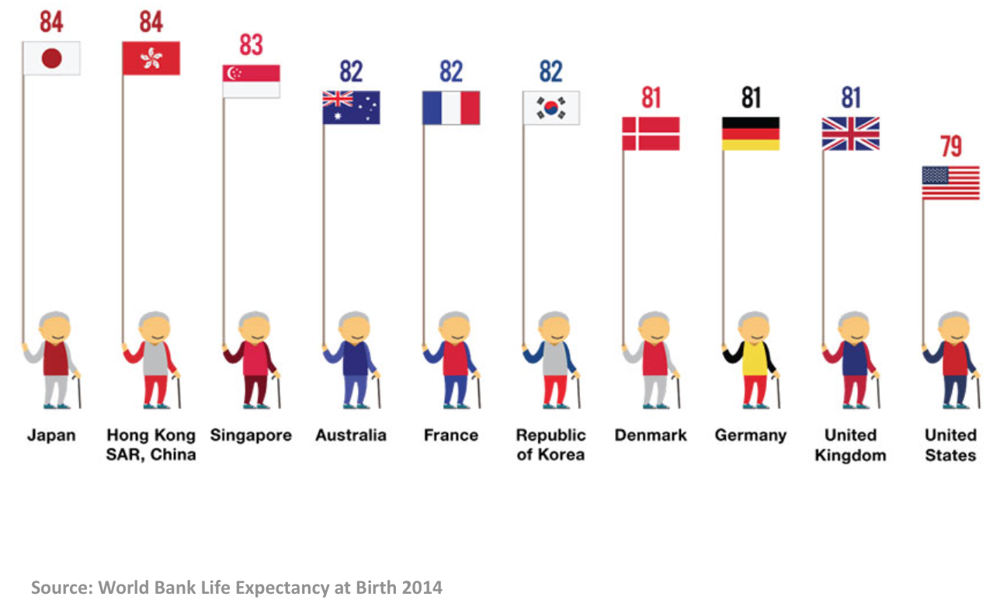

<br>
<br> <center> <font size="12" color=Orange>Research Questions</font> </center> <br/>

<br>
<br> <font size="5" color=Green>Which Countries have the highest and lowest Life Expectancy?</font> <br/>
<br> <font size="5" color=Green>What are the factors on which Life Expectancy depends?</font> <br/>
<br> <font size="5" color=Green>What is the effect of Percentage of the Aggregate Total Income on Life Expectancy?
</font> <br/>
<br> <font size="5" color=Green>Is there any effect of Schooling on Life Expectancy?</font> <br/>
<br> <font size="5" color=Green>How we can Predict the Life Expectancy in future?</font> <br/>
<br> <font size="5" color=Green>Which are the best algorithms to predict the Life Expectancy?</font> <br/>
<br>

<br>
<br> <center> <font size="12" color=Brown>Data Reading and Cleaning</font> </center> <br/>

# Importing Libraries

In [1]:
import pandas as pd
import seaborn as sns
from pylab import rcParams
import plotly.express as px
from sklearn.svm import SVR
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from plotly.offline import init_notebook_mode, iplot
from plotly.offline import iplot, init_notebook_mode
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor

# Reading Dataset

In [2]:
life_expectancy_df = pd.read_csv("led.csv")
life_expectancy_df.head(5)

,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,...,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


# Dataset Cleaning

## Dataset Columns

In [3]:
life_expectancy_df.columns

Index(['Country', 'Year', 'Status', 'Lifeexpectancy', 'AdultMortality',
       'infantdeaths', 'Alcohol', 'percentageexpenditure', 'HepatitisB',
       'Measles', 'BMI', 'under-fivedeaths', 'Polio', 'Totalexpenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')

## Shape of the Dataset

In [4]:
life_expectancy_df.shape

(2938, 22)

## Null values per column

In [5]:
life_expectancy_df.isnull().sum(axis = 0)

Country                           0
Year                              0
Status                            0
Lifeexpectancy                   10
AdultMortality                   10
infantdeaths                      0
Alcohol                         194
percentageexpenditure             0
HepatitisB                      553
Measles                           0
BMI                              34
under-fivedeaths                  0
Polio                            19
Totalexpenditure                226
Diphtheria                       19
HIV/AIDS                          0
GDP                             448
Population                      652
thinness1-19years                34
thinness5-9years                 34
Incomecompositionofresources    167
Schooling                       163
dtype: int64

## Filling null values with mean values

In [6]:
life_expectancy_df = life_expectancy_df.fillna(life_expectancy_df.mean())
life_expectancy_df.head(5)

,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,...,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [7]:
life_expectancy_df.replace('UnitedStatesofAmerica', 'USA')
life_expectancy_df.replace(to_replace = 'UnitedStatesofAmerica' , value = 'USA', inplace = True)
life_expectancy_df['Country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola', 'AntiguaandBarbuda',
       'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan',
       'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus',
       'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia(PlurinationalStateof)', 'BosniaandHerzegovina',
       'Botswana', 'Brazil', 'BruneiDarussalam', 'Bulgaria',
       'BurkinaFaso', 'Burundi', "Côted'Ivoire", 'CaboVerde', 'Cambodia',
       'Cameroon', 'Canada', 'CentralAfricanRepublic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'CookIslands',
       'CostaRica', 'Croatia', 'Cuba', 'Cyprus', 'Czechia',
       "DemocraticPeople'sRepublicofKorea",
       'DemocraticRepublicoftheCongo', 'Denmark', 'Djibouti', 'Dominica',
       'DominicanRepublic', 'Ecuador', 'Egypt', 'ElSalvador',
       'EquatorialGuinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji',
       'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany',
       'Ghana', 'Greece', 'Gren

In [8]:
life_expectancy_df.columns

Index(['Country', 'Year', 'Status', 'Lifeexpectancy', 'AdultMortality',
       'infantdeaths', 'Alcohol', 'percentageexpenditure', 'HepatitisB',
       'Measles', 'BMI', 'under-fivedeaths', 'Polio', 'Totalexpenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')

In [11]:
life_expectancy_df.describe()

,Year,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,BMI,under-fivedeaths,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.938190,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.507640,124.080302,117.926501,3.916288,1987.914858,22.586855,11467.272489,19.927677,160.445548,23.352143,2.400274,23.640073,5.077785,13136.800417,5.381546e+07,4.394535,4.482708,0.204820,3.264381
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,80.940461,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.000000,144.000000,3.000000,4.160000,64.912906,87.000000,17.000000,43.000000,4.000000,93.000000,5.938190,93.000000,0.100000,3116.561755,3.675929e+06,3.400000,3.400000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7483.158469,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [12]:
life_expectancy_df.loc[(life_expectancy_df.Country == 'France'),'Status']='Developed'

life_expectancy_df.loc[(life_expectancy_df.Country == 'Canada'),'Status']='Developed'
life_expectancy_df.loc[(life_expectancy_df.Country == 'Greece'),'Status']='Developed'
life_expectancy_df.loc[(life_expectancy_df.Country == 'Estonia'),'Status']='Developed'
life_expectancy_df.loc[(life_expectancy_df.Country == 'RepublicofKorea'),'Status']='Developed'
life_expectancy_df[life_expectancy_df['Country'].str.match('Canada')]

,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,...,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
496,Canada,2015,Developed,82.2,64.0,2,4.602861,0.000000,55.000000,195,...,91.0,5.93819,91.0,0.1,43315.74400,3584861.0,0.6,0.5,0.919,16.3
497,Canada,2014,Developed,82.0,65.0,2,8.100000,102.190217,55.000000,418,...,91.0,1.45000,91.0,0.1,544.43376,35544564.0,0.5,0.5,0.912,15.9
498,Canada,2013,Developed,81.8,67.0,2,8.200000,9733.228019,55.000000,83,...,91.0,1.67000,91.0,0.1,52413.72116,35155451.0,0.5,0.5,0.909,15.9
499,Canada,2012,Developed,81.6,68.0,2,8.300000,9748.636237,7.000000,10,...,99.0,1.78000,95.0,0.1,52496.69487,3475545.0,0.5,0.5,0.907,15.9
500,Canada,2011,Developed,81.5,68.0,2,8.200000,971.928038,7.000000,803,...,87.0,1.82000,87.0,0.1,5282.21760,3434278.0,0.5,0.5,0.903,15.9
501,Canada,2010,Developed,81.2,7.0,2,8.400000,8649.674911,56.000000,99,...,88.0,11.20000,89.0,0.1,47447.47620,345274.0,0.5,0.4,0.898,15.9
502,Canada,2009,Developed,81.0,72.0,2,8.400000,864.949930,42.000000,14,...,89.0,11.17000,91.0,0.1,4773.45436,33628571.0,0.5,0.4,0.898,15.9
503,Canada,2008,Developed,87.0,74.0,2,8.300000,8433.936814,28.000000,62,...,89.0,1.30000,92.0,0.1,46596.33599,33245773.0,0.5,0.4,0.897,15.8
504,Canada,2007,Developed,85.0,74.0,2,8.300000,7946.743581,14.000000,101,...,9.0,9.83000,94.0,0.1,44544.52680,32887928.0,0.5,0.4,0.894,15.8
505,Canada,2006,Developed,85.0,75.0,2,8.200000,771.181769,14.000000,13,...,95.0,9.75000,95.0,0.1,4386.69948,325755.0,0.5,0.4,0.891,15.8


array([[<AxesSubplot:title={'center':'Year'}>,
        <AxesSubplot:title={'center':'Lifeexpectancy'}>,
        <AxesSubplot:title={'center':'AdultMortality'}>,
        <AxesSubplot:title={'center':'infantdeaths'}>],
       [<AxesSubplot:title={'center':'Alcohol'}>,
        <AxesSubplot:title={'center':'percentageexpenditure'}>,
        <AxesSubplot:title={'center':'HepatitisB'}>,
        <AxesSubplot:title={'center':'Measles'}>],
       [<AxesSubplot:title={'center':'BMI'}>,
        <AxesSubplot:title={'center':'under-fivedeaths'}>,
        <AxesSubplot:title={'center':'Polio'}>,
        <AxesSubplot:title={'center':'Totalexpenditure'}>],
       [<AxesSubplot:title={'center':'Diphtheria'}>,
        <AxesSubplot:title={'center':'HIV/AIDS'}>,
        <AxesSubplot:title={'center':'GDP'}>,
        <AxesSubplot:title={'center':'Population'}>],
       [<AxesSubplot:title={'center':'thinness1-19years'}>,
        <AxesSubplot:title={'center':'thinness5-9years'}>,
        <AxesSubplot:title={'

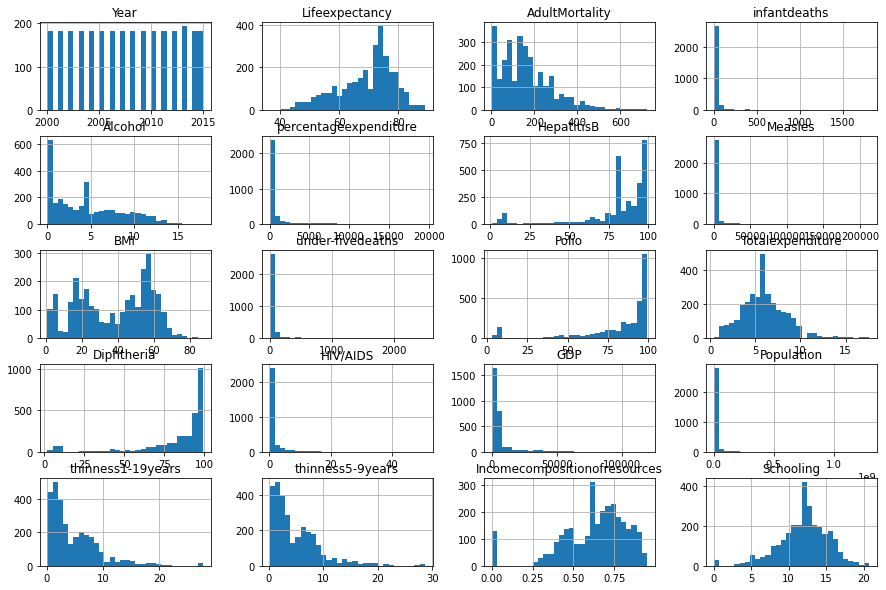

In [13]:
life_expectancy_df.hist(bins=30, figsize=(15, 10))

<br>
<br> <center> <font size="12" color=Brown>Exploratory Data Analysis</font> </center> <br/>

# Life Expectancy of Each Country 

In [14]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['Lifeexpectancy'],
        text = life_expectancy_df['Country'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'Life Expectancy'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Life Expectancy of Each Country',
    
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d3-world-map' )

# Life Expectancy per Year for each Country

In [15]:
df = life_expectancy_df[['Country','Year','Lifeexpectancy']]
data = pd.pivot_table(df, values = 'Lifeexpectancy', index=['Year'], columns = 'Country').reset_index()
data.to_csv("data.csv",index = False)
data = pd.read_csv("data.csv")
data = data.set_index(['Year'])
fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index,
                         y=data[data.columns[0]],
                         visible=True)
             )

updatemenu = []
buttons = []
# button with one option for each dataframe
for col in data.columns:
    buttons.append(dict(method='restyle',
                        label=col,
                        visible=True,
                        args=[{'y':[data[col]],
                               'x':[data.index],
                               'type':'scatter'}, [0]],
                        )
                  )
# some adjustments to the updatemenus
updatemenu = []
your_menu = dict()
updatemenu.append(your_menu)
updatemenu[0]['buttons'] = buttons
updatemenu[0]['direction'] = 'down'
updatemenu[0]['showactive'] = True
# add dropdown menus to the figure
fig.update_layout(showlegend=False, updatemenus=updatemenu)
fig.show()

# Difference of Life Expectancy by Country Status

In [16]:
Sense=pd.DataFrame(life_expectancy_df.groupby(['Status','Year'])['Lifeexpectancy'].mean())
Sense=Sense.reset_index()
init_notebook_mode()
df = Sense
layout = dict(
title='Life Expectancy Per Year per Country Status',
xaxis=dict(title='Years'),
yaxis=dict(title='Life Expectancy'))
grouped = df.groupby('Status')
data = [go.Trace(dict(x=values['Year'], y=values['Lifeexpectancy'], name=key)) for key, values in grouped]
fig = go.Figure(data=data, layout=layout)
iplot(fig)

/Users/emmaminasyan/opt/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:687: DeprecationWarning:

plotly.graph_objs.Trace is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




# Infant Deaths per Country

In [17]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['infantdeaths'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'Infant Deaths'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Infant Deaths per Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# Under Five Deaths of each Country

In [18]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['under-fivedeaths'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'Under-Five Deaths'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Under Five Deaths each Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# GDP per Country

In [19]:
from plotly.offline import init_notebook_mode, iplot
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['GDP'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'GDP'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'GDP per Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# Percentage of the Aggregate Total Income of Each Country

In [20]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['Incomecompositionofresources'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'IncomeCompositionOfResources'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Percentage of the Aggregate Total Income of Each Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# Alcohol use for each Country

In [21]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['Alcohol'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'Alcohol'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Alcohol use for each Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# Schooling in each Country

In [22]:
# create data for using in iplot function
count = [ dict(
        # set the map type is choropleth  
        type = 'choropleth',
        locations = life_expectancy_df['Country'],
        locationmode='country names',
        z = life_expectancy_df['Schooling'],
        text = life_expectancy_df['Lifeexpectancy'],
        colorscale = 'Viridis',
        autocolorscale = False,
        reversescale = True,
        # set the plotly gragh color
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        # add a color bar 
        colorbar = dict(
            autotick =False,
            title = 'Schooling'),
      ) ]
# create layout for gragh
layout = dict(
    title = 'Schooling in each Country',
    # 
    geo = dict(
        showframe = True,
        showcoastlines = True,
        projection = dict(
            type = 'Mercator'
        )
    )
)
# prepare the fig parameter
fig = dict( data=count, layout=layout )
iplot( fig, validate=False, filename='d4-world-map' )

# Different Attributes Dependency on Life Expectancy

Text(0.5, 1.0, 'Life Expectancy - Thinness 1-19 Years')

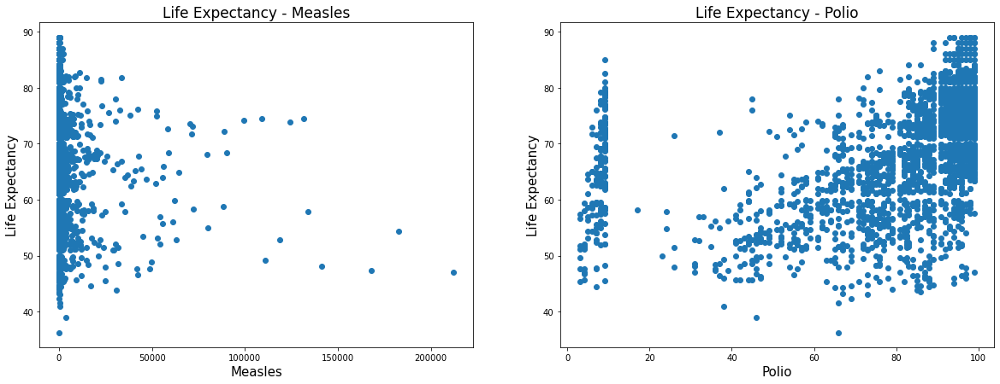

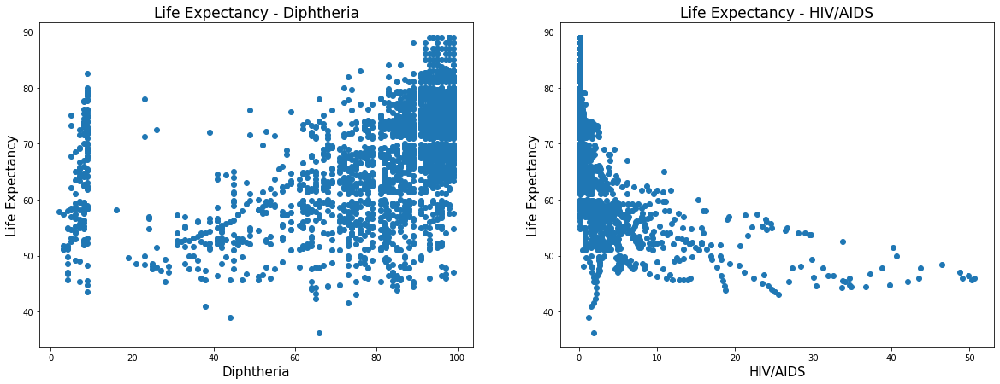

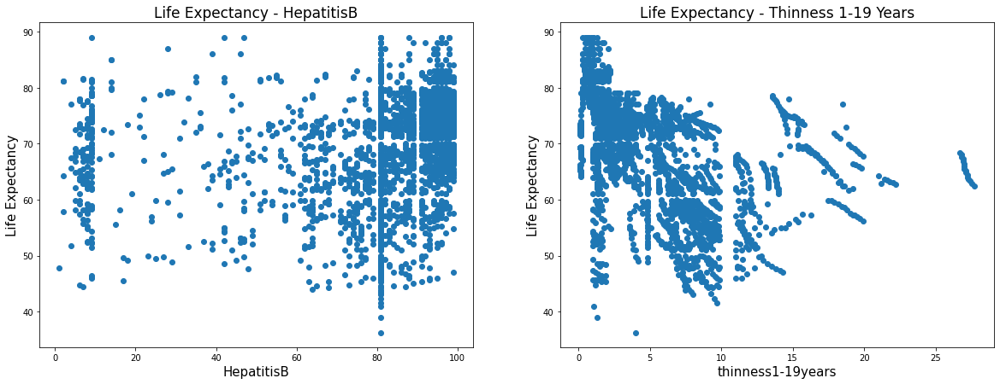

In [23]:
plt.figure(figsize=(20,7))
plt.subplot(1, 2, 1)
plt.scatter(life_expectancy_df["Measles"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("Measles",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - Measles",fontsize=17)

plt.subplot(1, 2, 2)
plt.scatter(life_expectancy_df["Polio"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("Polio",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - Polio",fontsize=17)

plt.figure(figsize=(20,7))
plt.subplot(1, 2, 1)
plt.scatter(life_expectancy_df["Diphtheria"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("Diphtheria",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - Diphtheria",fontsize=17)

plt.subplot(1, 2, 2)
plt.scatter(life_expectancy_df["HIV/AIDS"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("HIV/AIDS",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - HIV/AIDS",fontsize=17)

plt.figure(figsize=(20,7))
plt.subplot(1, 2, 1)
plt.scatter(life_expectancy_df["HepatitisB"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("HepatitisB",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - HepatitisB",fontsize=17)

plt.subplot(1, 2, 2)
plt.scatter(life_expectancy_df["thinness1-19years"], life_expectancy_df["Lifeexpectancy"])
plt.xlabel("thinness1-19years",fontsize=15)
plt.ylabel("Life Expectancy",fontsize=15)
plt.title("Life Expectancy - Thinness 1-19 Years",fontsize=17)

# Correlation Heatmap for all the Numeric Attributes

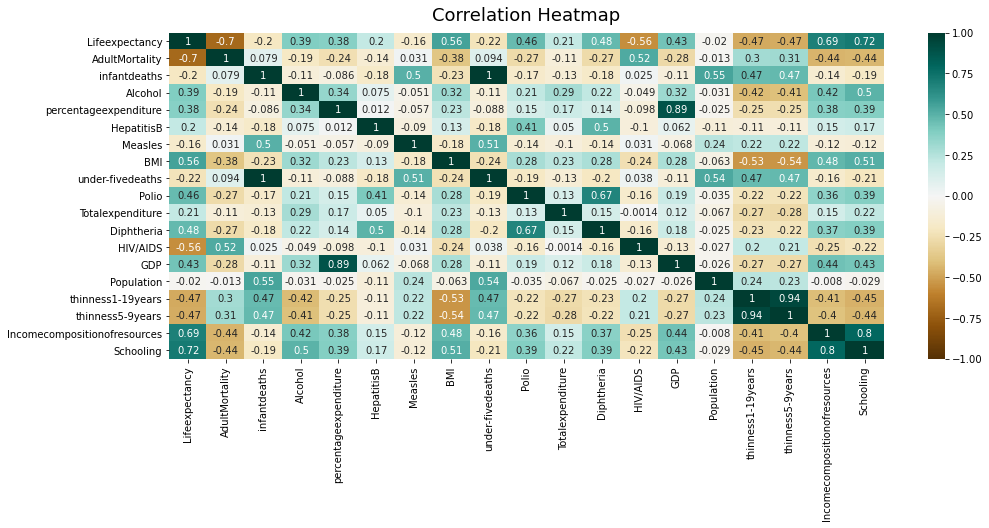

In [24]:
dataframe = life_expectancy_df[['Lifeexpectancy', 'AdultMortality',
       'infantdeaths', 'Alcohol', 'percentageexpenditure', 'HepatitisB',
       'Measles', 'BMI', 'under-fivedeaths', 'Polio', 'Totalexpenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling']]
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(dataframe.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);# save heatmap as .png file
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

<br>
<br> <center> <font size="12" color=Brown>Machine Learning Modeling</font> </center> <br/>

# Setting Input and Output for ML Models

In [25]:
X = life_expectancy_df[['infantdeaths', 'Alcohol', 'percentageexpenditure', 'BMI', 'under-fivedeaths', 'Polio', 'Totalexpenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP',
       'Incomecompositionofresources', 'Schooling']]
y = life_expectancy_df[['Lifeexpectancy']]
X_train,X_test,y_train,y_test = train_test_split(X, y,test_size=0.20, shuffle=False)

# Random Forest Regressor

Mean Squared Error:  12.731434400492011


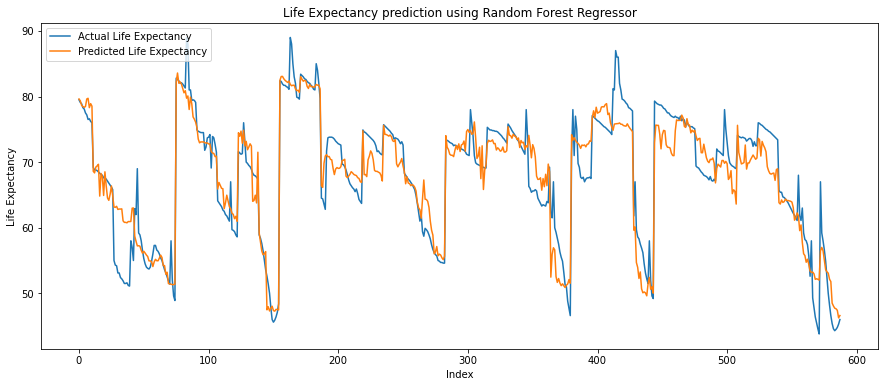

In [26]:
reg = RandomForestRegressor(n_estimators=200,random_state=0)
reg.fit(X_train,y_train.values.ravel())
pre = reg.predict(X_test)
rms = mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using Random Forest Regressor")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_RandomForestRegressor = rms
predicted_RandomForestRegressor = pre

# Support Vector Machine

Mean Squared Error:  78.78558731073741


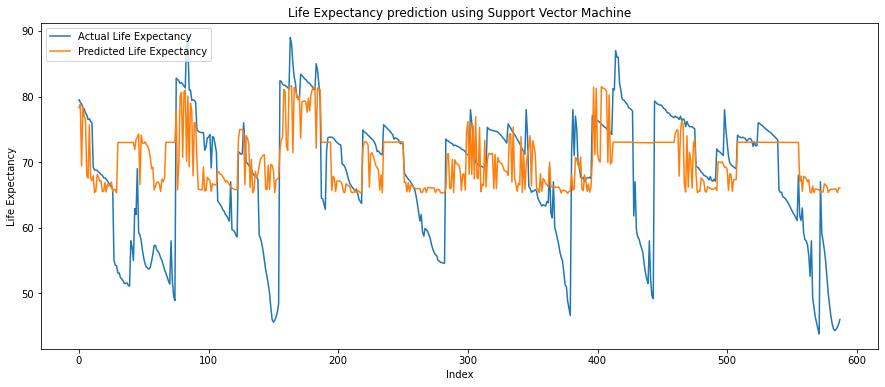

In [27]:
reg=SVR()
reg.fit(X_train,y_train.values.ravel())
pre=reg.predict(X_test)
rms=mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using Support Vector Machine")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_SVR = rms
predicted_SVR = pre

# KNeighbors Regressor

Mean Squared Error:  53.89798197326363


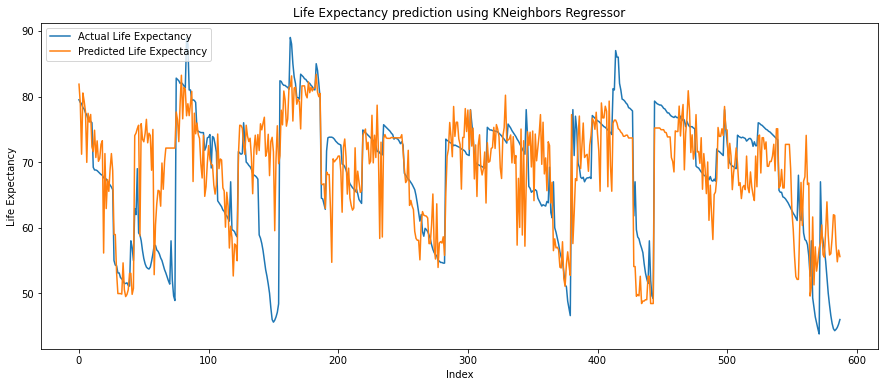

In [28]:
reg=KNeighborsRegressor()
reg.fit(X_train,y_train.values.ravel())
pre=reg.predict(X_test)
rms=mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using KNeighbors Regressor")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_KNeighborsRegressor = rms
predicted_KNeighborsRegressor = pre

# Linear Regression

Mean Squared Error:  25.512883048396578


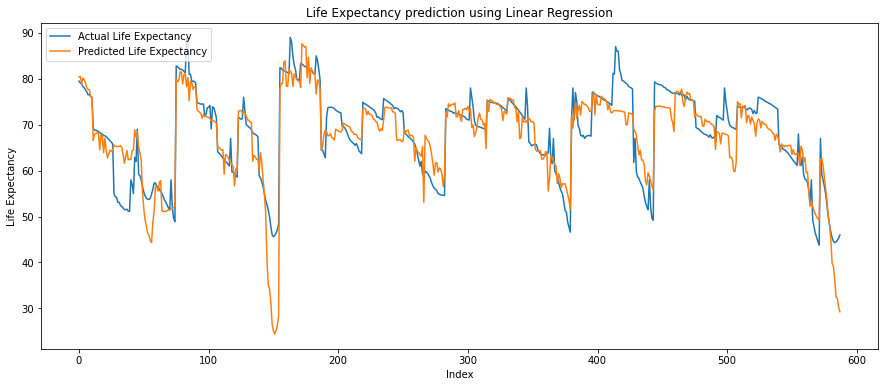

In [29]:
reg=LinearRegression()
reg.fit(X_train,y_train.values.ravel())
pre=reg.predict(X_test)
rms=mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using Linear Regression")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_LinearRegression = rms
predicted_LinearRegression = pre

# Decision Tree Regressor

Mean Squared Error:  33.32469216994042


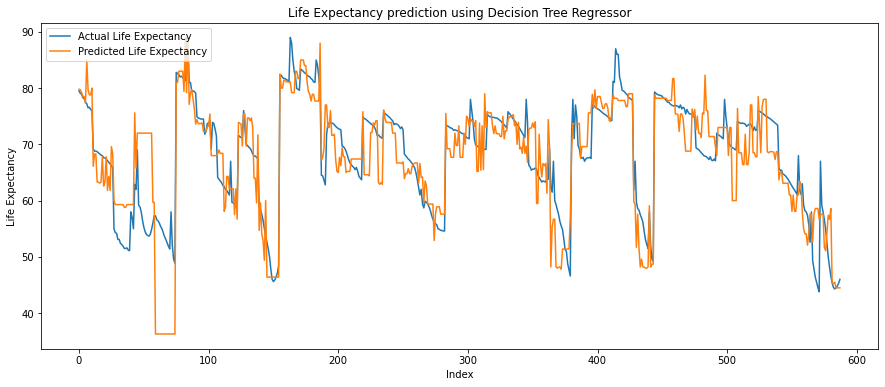

In [30]:
reg=DecisionTreeRegressor()
reg.fit(X_train,y_train.values.ravel())
pre=reg.predict(X_test)
rms=mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using Decision Tree Regressor")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_DecisionTreeRegressor = rms
predicted_DecisionTreeRegressor = pre

# Gradient Boosting Regressor

Mean Squared Error:  14.088844856760494


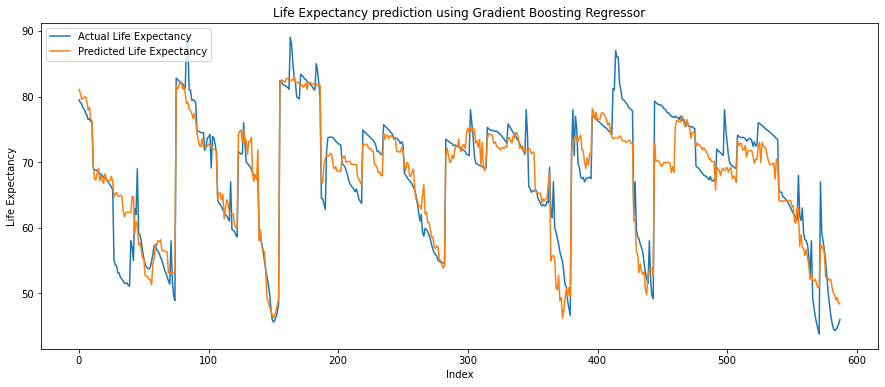

In [31]:
reg=GradientBoostingRegressor()
reg.fit(X_train,y_train.values.ravel())
pre=reg.predict(X_test)
rms=mean_squared_error(y_test,pre)
print("Mean Squared Error: ",rms)
plt.rcParams["figure.figsize"] = (15,6)
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(pre)
plt.title("Life Expectancy prediction using Gradient Boosting Regressor")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy', 'Predicted Life Expectancy'], loc='upper left')
plt.show()
RMSE_GradientBoostingRegressor = rms
predicted_GradientBoostingRegressor = pre

# Compaersion of Models Predictions with Actual Life Expectancy

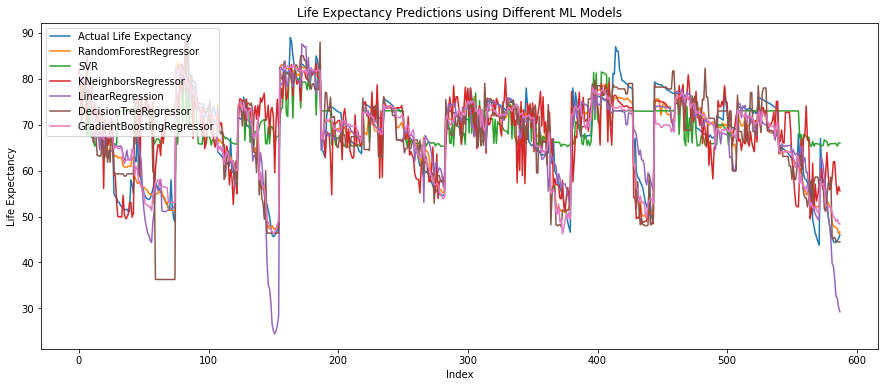

In [32]:
plt.plot(y_test.Lifeexpectancy.values)
plt.plot(predicted_RandomForestRegressor)
plt.plot(predicted_SVR)
plt.plot(predicted_KNeighborsRegressor)
plt.plot(predicted_LinearRegression)
plt.plot(predicted_DecisionTreeRegressor)
plt.plot(predicted_GradientBoostingRegressor)
plt.rcParams["figure.figsize"] = (15,6)
plt.title("Life Expectancy Predictions using Different ML Models")
plt.ylabel("Life Expectancy")
plt.xlabel("Index")
plt.legend(['Actual Life Expectancy','RandomForestRegressor','SVR' ,'KNeighborsRegressor','LinearRegression','DecisionTreeRegressor','GradientBoostingRegressor'
           ], loc='upper left')
plt.show()

# Which Model is the Best to predict the Life Expectancy

In [33]:
RMSE = pd.DataFrame()
RMSE['Models'] = ['RandomForestRegressor', 'SupportVectorMachine', 'KNeighborsRegressor',
       'LinearRegression', 'DecisionTreeRegressor',
       'GradientBoostingRegressor']
RMSE['Root Mean Squared Error'] = [RMSE_RandomForestRegressor, RMSE_SVR, RMSE_KNeighborsRegressor,
       RMSE_LinearRegression,RMSE_DecisionTreeRegressor,RMSE_GradientBoostingRegressor]
RMSE = RMSE.sort_values(by = 'Root Mean Squared Error')
fig = px.bar(RMSE, x='Models', y="Root Mean Squared Error",title="Mean Squared Error for Each Algorithm",color='Root Mean Squared Error')
fig.show()